# 🔥 Diffusion Models

In this notebook, we'll walk through the steps required to train your own diffusion model on the Oxford flowers dataset

The code is adapted from the excellent ['Denoising Diffusion Implicit Models' tutorial](https://keras.io/examples/generative/ddim/) created by András Béres available on the Keras website.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

plt.style.use("seaborn-v0_8-colorblind")

import math

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    optimizers,
    utils,
    callbacks,
    metrics,
    losses,
    activations,
)

from utils import display, sample_batch

## 0. Parameters <a name="parameters"></a>

In [2]:
IMAGE_SIZE = 64
BATCH_SIZE = 64
DATASET_REPETITIONS = 5
LOAD_MODEL = False

NOISE_EMBEDDING_SIZE = 32
PLOT_DIFFUSION_STEPS = 20

# optimization
EMA = 0.999
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4
EPOCHS = 50

## 1. Prepare the Data

In [5]:
# Load the data
train_data = utils.image_dataset_from_directory(
    "./data/pytorch-challange-flower-dataset/dataset",
    labels=None,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=None,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 8189 files belonging to 1 classes.


In [7]:
# Preprocess the data
def preprocess(img):
    img = tf.cast(img, "float32") / 255.0
    return img


train = train_data.map(lambda x: preprocess(x))
train = train.repeat(DATASET_REPETITIONS) #повторяем данные 5 раз
train = train.batch(BATCH_SIZE, drop_remainder=True) #разбиваем данные на батчи

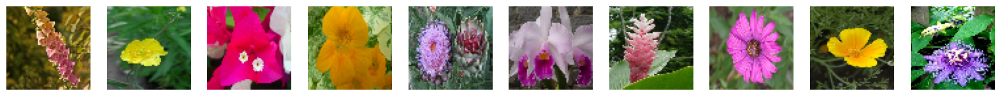

In [8]:
#примеры
train_sample = sample_batch(train)
display(train_sample)

### 1.1 Diffusion schedules <a name="diffusion_schedules"></a>

In [9]:
#линейный режим диффузии, на ранних стадиях шума добавляется меньше
def linear_diffusion_schedule(diffusion_times):
    min_rate = 0.0001
    max_rate = 0.02
    betas = min_rate + diffusion_times * (max_rate - min_rate)
    alphas = 1 - betas
    alpha_bars = tf.math.cumprod(alphas)
    signal_rates = tf.sqrt(alpha_bars)
    noise_rates = tf.sqrt(1 - alpha_bars)
    return noise_rates, signal_rates

In [10]:
#косинусный режим диффузии
def cosine_diffusion_schedule(diffusion_times):
    signal_rates = tf.cos(diffusion_times * math.pi / 2)
    noise_rates = tf.sin(diffusion_times * math.pi / 2)
    return noise_rates, signal_rates

In [11]:
#смещенный косинусный режим диффузии, корректирует режим так, чтобы шаги зашумленния не оказались слишком маленькими в начале
def offset_cosine_diffusion_schedule(diffusion_times):
    min_signal_rate = 0.02
    max_signal_rate = 0.95
    start_angle = tf.acos(max_signal_rate)
    end_angle = tf.acos(min_signal_rate)

    diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

    signal_rates = tf.cos(diffusion_angles)
    noise_rates = tf.sin(diffusion_angles)

    return noise_rates, signal_rates

In [12]:
T = 1000
diffusion_times = tf.convert_to_tensor([x / T for x in range(T)])
linear_noise_rates, linear_signal_rates = linear_diffusion_schedule(
    diffusion_times
)
cosine_noise_rates, cosine_signal_rates = cosine_diffusion_schedule(
    diffusion_times
)
(
    offset_cosine_noise_rates,
    offset_cosine_signal_rates,
) = offset_cosine_diffusion_schedule(diffusion_times)

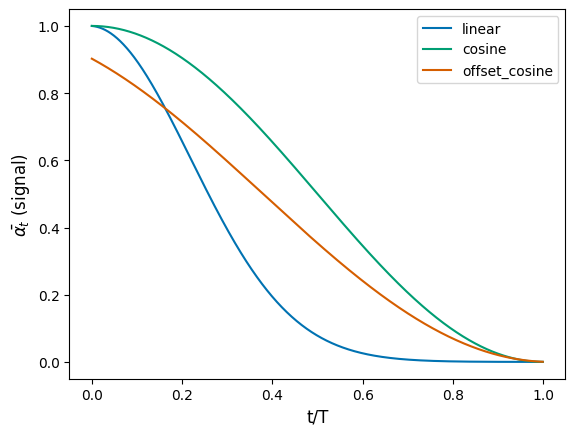

In [13]:
#велечина сигнала при разных режимах диффузии
plt.plot(
    diffusion_times, linear_signal_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_signal_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_signal_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$\bar{\alpha_t}$ (signal)", fontsize=12)
plt.legend()
plt.show()

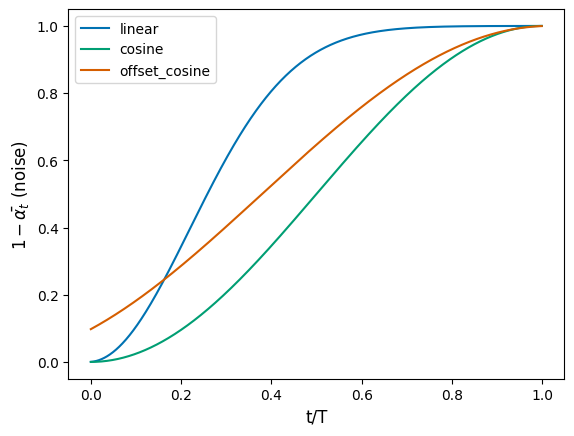

In [14]:
#велечина шума при разных режимах диффузии
plt.plot(
    diffusion_times, linear_noise_rates**2, linewidth=1.5, label="linear"
)
plt.plot(
    diffusion_times, cosine_noise_rates**2, linewidth=1.5, label="cosine"
)
plt.plot(
    diffusion_times,
    offset_cosine_noise_rates**2,
    linewidth=1.5,
    label="offset_cosine",
)

plt.xlabel("t/T", fontsize=12)
plt.ylabel(r"$1-\bar{\alpha_t}$ (noise)", fontsize=12)
plt.legend()
plt.show()

## 2. Build the model <a name="build"></a>

In [15]:
#функиця синусоидального представления, преобразующая дисперсию шума в векторное представление
def sinusoidal_embedding(x):
    frequencies = tf.exp(
        tf.linspace(
            tf.math.log(1.0),
            tf.math.log(1000.0),
            NOISE_EMBEDDING_SIZE // 2,
        )
    )
    angular_speeds = 2.0 * math.pi * frequencies
    embeddings = tf.concat(
        [tf.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
    )
    return embeddings

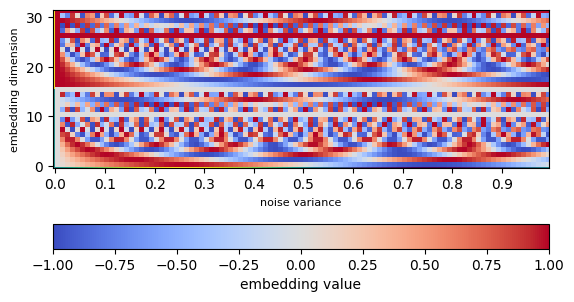

In [16]:
#шаблон синусоидального представления для диспресии шума от 0 до 1
embedding_list = []
for y in np.arange(0, 1, 0.01):
    embedding_list.append(sinusoidal_embedding(np.array([[[[y]]]]))[0][0][0])
embedding_array = np.array(np.transpose(embedding_list))
fig, ax = plt.subplots()
ax.set_xticks(
    np.arange(0, 100, 10), labels=np.round(np.arange(0.0, 1.0, 0.1), 1)
)
ax.set_ylabel("embedding dimension", fontsize=8)
ax.set_xlabel("noise variance", fontsize=8)
plt.pcolor(embedding_array, cmap="coolwarm")
plt.colorbar(orientation="horizontal", label="embedding value")
ax.imshow(embedding_array, interpolation="nearest", origin="lower")
plt.show()

In [17]:
#Остаточный блок, пропускающая связь - добавляет входные данные в выходные 
def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width: #проверка кол-ва каналов на входе и выходе блока
            residual = x
        else:
            residual = layers.Conv2D(width, kernel_size=1)(x)
        x = layers.BatchNormalization(center=False, scale=False)(x) #BatchNormalization
        x = layers.Conv2D(
            width, kernel_size=3, padding="same", activation=activations.swish
        )(x) #два слоя свертки
        x = layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = layers.Add()([x, residual]) #добавление входных данных в выходные
        return x

    return apply

#увеличивает кол-во каналов, уменьшает изображение
def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x) #увеличивает кол-во каналов, используя ResidualBlock
            skips.append(x) #сохраняется в списке skips для полседующего использования в UpBlock
        x = layers.AveragePooling2D(pool_size=2)(x) #уменьшаем размерность изображения
        return x

    return apply

#уменьшает кол-во каналов, увеличивает изображение
def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = layers.UpSampling2D(size=2, interpolation="bilinear")(x) #увеличиваем размер изображения
        for _ in range(block_depth):
            x = layers.Concatenate()([x, skips.pop()]) #выходные данные слоя DownBlock добавляются в текущий вывод
            x = ResidualBlock(width)(x) #ResidualBlock используется для для уменьшения кол-ва каналов 
        return x

    return apply

In [18]:
# Build the U-Net (предсказывает шум, добавленный в изображение)

noisy_images = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3)) #первый вход - изображение из которого нужно удалить шум
x = layers.Conv2D(32, kernel_size=1)(noisy_images) #увеличиваем кол-во каналов

noise_variances = layers.Input(shape=(1, 1, 1)) #второй вход - дисперсия шума
noise_embedding = layers.Lambda(sinusoidal_embedding)(noise_variances) #кодируем дисперсию с использованием синусоидального представления
noise_embedding = layers.UpSampling2D(size=IMAGE_SIZE, interpolation="nearest")(
    noise_embedding
) #копируем это представление по всем измерениям

x = layers.Concatenate()([x, noise_embedding]) #два входных потока объединяются по каналам

skips = [] #список слоев с выходными данными слоев DownBlock

x = DownBlock(32, block_depth=2)([x, skips]) #тензор пропускается через серию слоев DownBlock, которые уменьшают размер изображение и увеличивают число каналов
x = DownBlock(64, block_depth=2)([x, skips])
x = DownBlock(96, block_depth=2)([x, skips])

x = ResidualBlock(128)(x) #передем тензор в два слоя ResidualBlock, которые сохраняют размер изображения и каналы постоянными
x = ResidualBlock(128)(x)

x = UpBlock(96, block_depth=2)([x, skips]) #серия слоев UpBlock, которые увеличивают размер изображения и уменьшают число каналов.Пропускающие связи добавляют выходные данные из ранних слоев DownBlock
x = UpBlock(64, block_depth=2)([x, skips])
x = UpBlock(32, block_depth=2)([x, skips])

x = layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x) #уменьшаем кол-во каналов до 3(RGB)

unet = models.Model([noisy_images, noise_variances], x, name="unet") #модель принимает зашумленные изображения и дисперсию шума, выводит - прогнозируемую карту шума
unet.summary()

Model: "unet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 1, 1, 1)]    0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 lambda (Lambda)                (None, 1, 1, 32)     0           ['input_2[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 32)   128         ['input_1[0][0]']                
                                                                                               

In [19]:
class DiffusionModel(models.Model):
    def __init__(self):
        super().__init__()

        self.normalizer = layers.Normalization()
        self.network = unet
        self.ema_network = models.clone_model(self.network)
        self.diffusion_schedule = offset_cosine_diffusion_schedule

    def compile(self, **kwargs):
        super().compile(**kwargs)
        self.noise_loss_tracker = metrics.Mean(name="n_loss")

    @property
    def metrics(self):
        return [self.noise_loss_tracker]

    #денормализация изображений (возращаем значения пикселов к 0,1)
    def denormalize(self, images):
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return tf.clip_by_value(images, 0.0, 1.0)

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        if training:
            network = self.network
        else:
            network = self.ema_network
        pred_noises = network(
            [noisy_images, noise_rates**2], training=training
        )
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    #выборка из модели, обратная диффузия, детерминированная (DDIM)
    def reverse_diffusion(self, initial_noise, diffusion_steps):
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps
        current_images = initial_noise
        for step in range(diffusion_steps): #выполнение фиксированного кол-ва шагов
            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size #все времена диффузии устанавливаются 1, т.е начало процесса обратной диффузии
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times) #вычисляются уровни шума и сигнала в соответствии с режимом диффузии
            pred_noises, pred_images = self.denoise(
                current_images, noise_rates, signal_rates, training=False
            ) #прогнозируем шум используя U-Net
            next_diffusion_times = diffusion_times - step_size #время диффузии уменьшается на один шаг
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            ) #рассчитываются новые уровни сигнала и шума
            current_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            ) #изображение t-1 рассчитывается путем повторного применения прогнозируемого шума к прогнозируемому изображению
        return pred_images #окончательное изображение пссле всех шагов

    #генерация изображений
    def generate(self, num_images, diffusion_steps, initial_noise=None):
        if initial_noise is None:
            initial_noise = tf.random.normal(
                shape=(num_images, IMAGE_SIZE, IMAGE_SIZE, 3)
            ) #создание начальных карт шума
        generated_images = self.reverse_diffusion(
            initial_noise, diffusion_steps
        ) #обратная диффузия
        generated_images = self.denormalize(generated_images) #денормализация
        return generated_images

    def train_step(self, images):
        images = self.normalizer(images, training=True) #нормализуем изображения
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3)) #генерируем шумовой тензор 

        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        ) #выбираем случайные времена диффузии
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times) #получаем соотношения сигнал/шум в соответствии с режимом косинусной диффузии

        noisy_images = signal_rates * images + noise_rates * noises #применяем взвешивание сигнала и шума к входным изображениям для создания зашумленных изображений

        with tf.GradientTape() as tape:
            # train the network to separate noisy images to their components
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            ) #удаляем шум, предлогая сети спрогнозировать шумБ а затем отменяя операцию зашумления 

            noise_loss = self.loss(noises, pred_noises)  #потери, mae между прогнозируемым и истинным шумом

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(
            zip(gradients, self.network.trainable_weights)
        ) #делаем градиентный шаг 

        self.noise_loss_tracker.update_state(noise_loss)

        for weight, ema_weight in zip(
            self.network.weights, self.ema_network.weights
        ):
            ema_weight.assign(EMA * ema_weight + (1 - EMA) * weight) #веса сети EMA оновляются до взвешенного среднего значения существующих весов EMA и весов сети после градиентного шага

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, images):
        images = self.normalizer(images, training=False)
        noises = tf.random.normal(shape=(BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))
        diffusion_times = tf.random.uniform(
            shape=(BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        noisy_images = signal_rates * images + noise_rates * noises
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )
        noise_loss = self.loss(noises, pred_noises)
        self.noise_loss_tracker.update_state(noise_loss)

        return {m.name: m.result() for m in self.metrics}

In [20]:
ddm = DiffusionModel()
ddm.normalizer.adapt(train)

In [ ]:
if LOAD_MODEL:
    ddm.built = True
    ddm.load_weights("./checkpoint/checkpoint.ckpt")

## 3.Train the model <a name="train"></a>

In [21]:
ddm.compile(
    optimizer=optimizers.experimental.AdamW(
        learning_rate=LEARNING_RATE, weight_decay=WEIGHT_DECAY
    ),
    loss=losses.mean_absolute_error,
)

Epoch 1/7


639/639 [==============================] - ETA: 0s - n_loss: 0.1860
Saved to ./output/generated_img_000.png


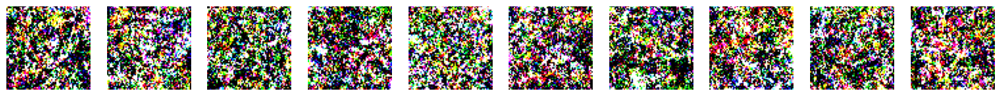

639/639 [==============================] - 2845s 4s/step - n_loss: 0.1860
Epoch 2/7
639/639 [==============================] - ETA: 0s - n_loss: 0.1832
Saved to ./output/generated_img_001.png


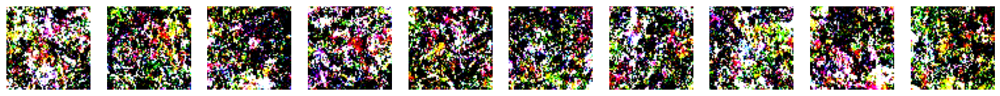

639/639 [==============================] - 2787s 4s/step - n_loss: 0.1832
Epoch 3/7
639/639 [==============================] - ETA: 0s - n_loss: 0.1819
Saved to ./output/generated_img_002.png


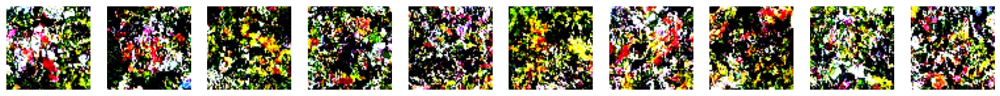

639/639 [==============================] - 2665s 4s/step - n_loss: 0.1819
Epoch 4/7
639/639 [==============================] - ETA: 0s - n_loss: 0.1804
Saved to ./output/generated_img_003.png


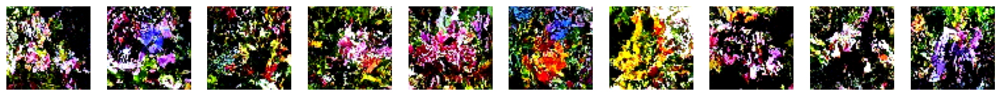

639/639 [==============================] - 2657s 4s/step - n_loss: 0.1804
Epoch 5/7
639/639 [==============================] - ETA: 0s - n_loss: 0.1795
Saved to ./output/generated_img_004.png


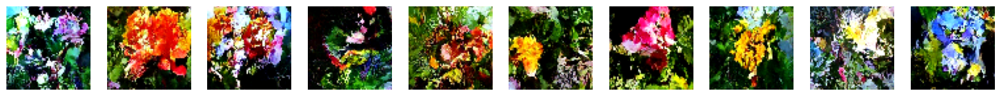

639/639 [==============================] - 2676s 4s/step - n_loss: 0.1795
Epoch 6/7
639/639 [==============================] - ETA: 0s - n_loss: 0.1784
Saved to ./output/generated_img_005.png


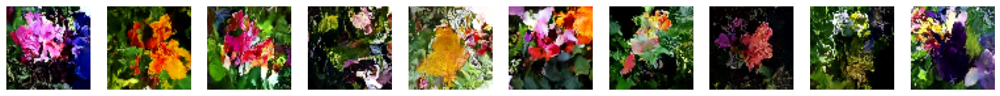

639/639 [==============================] - 2672s 4s/step - n_loss: 0.1784
Epoch 7/7
639/639 [==============================] - ETA: 0s - n_loss: 0.1784
Saved to ./output/generated_img_006.png


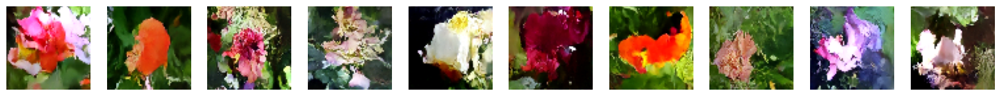

639/639 [==============================] - 2687s 4s/step - n_loss: 0.1784


In [24]:
# run training and plot generated images periodically
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generate(
            num_images=self.num_img,
            diffusion_steps=PLOT_DIFFUSION_STEPS,
        ).numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch),
        )


image_generator_callback = ImageGenerator(num_img=10)

ddm.fit(
    train,
    epochs=7,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        image_generator_callback,
    ],
)

## 4. Inference <a name="inference"></a>

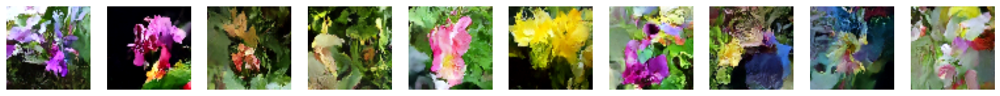

In [25]:
# Generate some novel images of flowers
generated_images = ddm.generate(num_images=10, diffusion_steps=20).numpy()
display(generated_images)

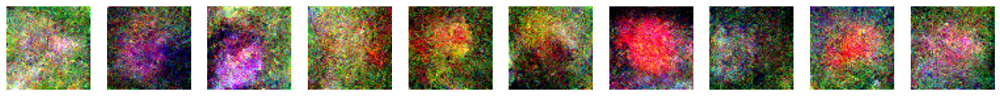

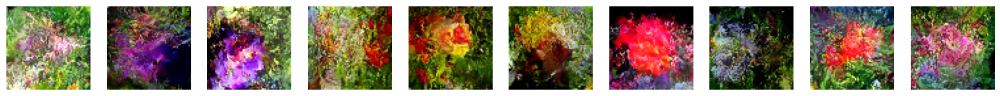

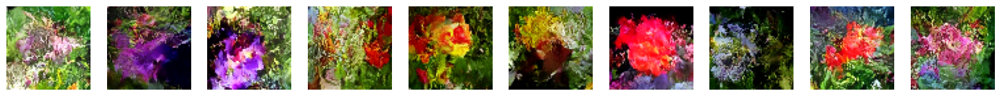

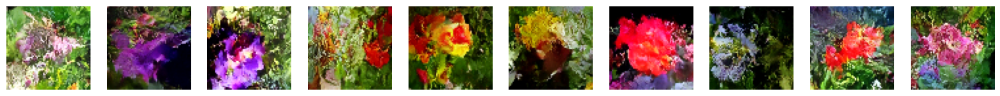

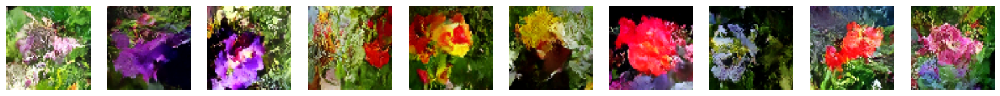

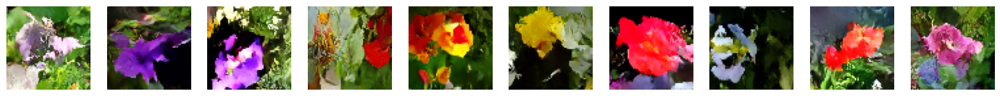

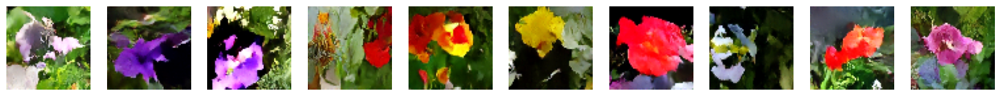

In [26]:
#генерация в зависимости от кол-ва шагов диффузии 
for diffusion_steps in list(np.arange(1, 6, 1)) + [20] + [100]:
    tf.random.set_seed(42)
    generated_images = ddm.generate(
        num_images=10,
        diffusion_steps=diffusion_steps,
    ).numpy()
    display(generated_images)

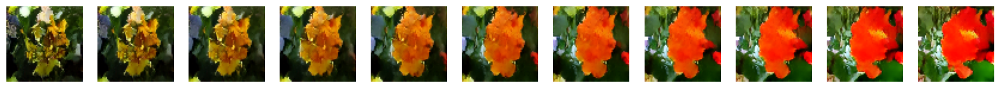

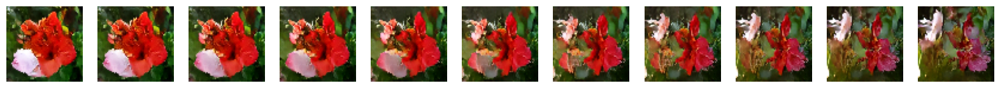

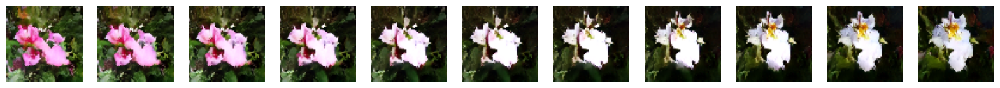

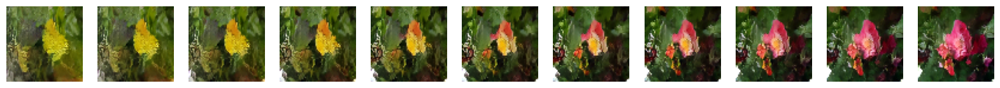

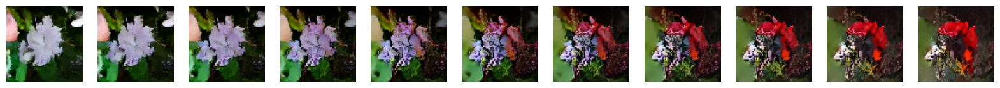

In [27]:
#интерполяция между изображениями
tf.random.set_seed(100)


def spherical_interpolation(a, b, t):
    return np.sin(t * math.pi / 2) * a + np.cos(t * math.pi / 2) * b


for i in range(5):
    a = tf.random.normal(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    b = tf.random.normal(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    initial_noise = np.array(
        [spherical_interpolation(a, b, t) for t in np.arange(0, 1.1, 0.1)]
    )
    generated_images = ddm.generate(
        num_images=2, diffusion_steps=20, initial_noise=initial_noise
    ).numpy()
    display(generated_images, n=11)